In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
import hvplot.pandas
from pathlib import Path
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split


Preprocessing Data for PCA

In [2]:
file_path = ('./consolidated.csv')
#climate_df = pd.read_csv(file_path, index_col=0)
climate_df = pd.read_csv(file_path)
climate_df

C:\Users\calla\AppData\Roaming\Python\Python37\site-packages\IPython\core\interactiveshell.py:3553: DtypeWarning: Columns (2,13) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,DATE,WND_direction,WND_dQC,WND_type,WND_speed,WND_speedQC,SKY_ceiling,SKY_ceilingQC,SKY_ceilingDC,SKY_CAVOK,VIS_distance,VIS_distanceQC,VIS_variability,VIS_variabilityQC,AIR_temp,AIR_tempQC,DEW_temp,DEW_tempQC,SLP_pressure,SLP_pressureQC
0,1/1/2013,80,5,N,88,5,549,5,M,N,4828,5,N,5,280,5,260,5,260,5
1,1/1/2013,90,5,N,57,5,610,5,M,N,6437,5,N,5,278,5,261,5,261,5
2,1/1/2013,90,5,N,62,5,884,5,M,N,6437,5,N,5,280,5,260,5,260,5
3,1/1/2013,70,5,N,77,5,640,5,M,N,4828,5,N,5,280,5,260,5,260,5
4,1/1/2013,80,5,N,82,5,945,5,M,N,16093,5,N,5,283,5,261,5,261,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55750,4/15/2023,80,5,N,77,5,22000,5,C,N,16093,5,N,5,310,7,230,7,230,7
55751,4/15/2023,60,5,N,57,5,22000,5,C,N,16093,5,N,5,280,7,230,7,230,7
55752,4/15/2023,60,5,N,57,5,1524,5,M,N,16093,5,N,5,280,7,230,7,230,7
55753,4/15/2023,70,5,N,62,5,1676,5,M,N,16093,5,N,5,272,5,222,5,222,5


In [4]:
core_weather = climate_df[["DATE", "WND_speed", "SKY_ceiling", "VIS_distance", "AIR_temp", "DEW_temp", "SLP_pressure"]].copy()
core_weather.columns = ["DT", "WIND", "SKY", "VISI", "AIRT", "DEWPT", "PRESS"]
core_weather

,DT,WIND,SKY,VISI,AIRT,DEWPT,PRESS
0,1/1/2013,88,549,4828,280,260,260
1,1/1/2013,57,610,6437,278,261,261
2,1/1/2013,62,884,6437,280,260,260
3,1/1/2013,77,640,4828,280,260,260
4,1/1/2013,82,945,16093,283,261,261
...,...,...,...,...,...,...,...
55750,4/15/2023,77,22000,16093,310,230,230
55751,4/15/2023,57,22000,16093,280,230,230
55752,4/15/2023,57,1524,16093,280,230,230
55753,4/15/2023,62,1676,16093,272,222,222


In [5]:
# Create a new DataFrame that holds only the DATE values.
new_df = pd.DataFrame(climate_df['DATE'])
new_df

,DATE
0,1/1/2013
1,1/1/2013
2,1/1/2013
3,1/1/2013
4,1/1/2013
...,...
55750,4/15/2023
55751,4/15/2023
55752,4/15/2023
55753,4/15/2023


In [7]:
# Use get_dummies() to create variables for text features.
X = pd.get_dummies(core_weather,columns=["DT", "WIND", "SKY", "VISI", "AIRT", "DEWPT", "PRESS"])
X.head(10)

,DT_1/1/2013,DT_1/1/2014,DT_1/1/2015,DT_1/1/2016,DT_1/1/2017,DT_1/1/2018,DT_1/1/2019,DT_1/1/2020,DT_1/1/2021,DT_1/1/2022,...,PRESS_264,PRESS_267,PRESS_268,PRESS_270,PRESS_272,PRESS_278,PRESS_280,PRESS_283,PRESS_289,PRESS_290
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [8]:
# Standardize the data with StandardScaler().
X_scaled = StandardScaler().fit_transform(X)
X_scaled

array([[ 6.09590026e+01, -1.64044679e-02, -1.89430975e-02, ...,
        -2.61154754e-02, -1.12055809e-02, -4.23508357e-03],
       [ 6.09590026e+01, -1.64044679e-02, -1.89430975e-02, ...,
        -2.61154754e-02, -1.12055809e-02, -4.23508357e-03],
       [ 6.09590026e+01, -1.64044679e-02, -1.89430975e-02, ...,
        -2.61154754e-02, -1.12055809e-02, -4.23508357e-03],
       ...,
       [-1.64044679e-02, -1.64044679e-02, -1.89430975e-02, ...,
        -2.61154754e-02, -1.12055809e-02, -4.23508357e-03],
       [-1.64044679e-02, -1.64044679e-02, -1.89430975e-02, ...,
        -2.61154754e-02, -1.12055809e-02, -4.23508357e-03],
       [-1.64044679e-02, -1.64044679e-02, -1.89430975e-02, ...,
        -2.61154754e-02, -1.12055809e-02, -4.23508357e-03]])

Reducing Data Dimensions using PCA

In [9]:
# Using PCA to reduce dimension to three principal components.
pca = PCA(n_components=3)
weather_pca = pca.fit_transform(X_scaled)
weather_pca

array([[-4.05327374, -1.60720854,  0.09808904],
       [-1.0592846 , -1.99773736, -0.40923522],
       [-3.77144565, -1.60822263,  0.19335435],
       ...,
       [-1.59081434,  2.10171055,  0.71872927],
       [ 1.50832824,  1.85791049,  0.38859535],
       [-2.52464839,  1.55901535,  0.67604751]])

In [10]:
# Create a DataFrame with the three principal components.
pcs_df = pd.DataFrame(weather_pca, columns=['PC1', 'PC2', 'PC3'], index = core_weather.index)
pcs_df.head(10)

,PC1,PC2,PC3
0,-4.053274,-1.607209,0.098089
1,-1.059285,-1.997737,-0.409235
2,-3.771446,-1.608223,0.193354
3,-3.880911,-1.657012,0.101418
4,0.327752,-1.664073,-0.034494
5,-2.533867,-1.488130,0.668295
6,-2.837745,-1.549283,0.606659
7,-2.508483,-1.300319,0.680302
8,0.365833,-1.747124,0.059049
9,-1.373388,-1.408424,0.517866


Clustering Weather Variables Using K-

Finding the Best Value for K Using the Elbow Curve

In [11]:
# Create an elbow curve to find the best value for K.
inertia = []
k = list(range(1, 11))

for i in k:
    km = KMeans(n_clusters=i, random_state=0)
    km.fit(pcs_df)
    inertia.append(km.inertia_)

elbow_data = {"k": k, "inertia": inertia}
df_elbow = pd.DataFrame(elbow_data)
df_elbow.hvplot.line(x="k", y="inertia", xticks=k, title="Elbow Curve")

:Curve   [k]   (inertia)

Running K-Means with k=4

In [12]:
# Initialize the K-Means model.
model = KMeans(n_clusters=4, random_state=0)

# Fit the model
model.fit(pcs_df)

# Predict clusters
predictions = model.predict(pcs_df)

pcs_df.head()

,PC1,PC2,PC3
0,-4.053274,-1.607209,0.098089
1,-1.059285,-1.997737,-0.409235
2,-3.771446,-1.608223,0.193354
3,-3.880911,-1.657012,0.101418
4,0.327752,-1.664073,-0.034494


In [13]:
# Create a new DataFrame including predicted clusters and weather features.
# Concatentate the core_weather and pcs_df DataFrames on the same columns.
clustered_df = pd.concat([core_weather, pcs_df], axis=1)

#  Add a new column, to the clustered_df DataFrame that holds the names of the cryptocurrencies. 
clustered_df["DATE"] = new_df

#  Add a new column, "Class" to the clustered_df DataFrame that holds the predictions.
clustered_df['Class'] = predictions

# Print the shape of the clustered_df
print(clustered_df.shape)
clustered_df.head(10)

(55755, 12)


,DT,WIND,SKY,VISI,AIRT,DEWPT,PRESS,PC1,PC2,PC3,DATE,Class
0,1/1/2013,88,549,4828,280,260,260,-4.053274,-1.607209,0.098089,1/1/2013,3
1,1/1/2013,57,610,6437,278,261,261,-1.059285,-1.997737,-0.409235,1/1/2013,0
2,1/1/2013,62,884,6437,280,260,260,-3.771446,-1.608223,0.193354,1/1/2013,3
3,1/1/2013,77,640,4828,280,260,260,-3.880911,-1.657012,0.101418,1/1/2013,3
4,1/1/2013,82,945,16093,283,261,261,0.327752,-1.664073,-0.034494,1/1/2013,0
5,1/1/2013,82,732,16093,290,260,260,-2.533867,-1.488130,0.668295,1/1/2013,3
6,1/1/2013,82,488,16093,290,260,260,-2.837745,-1.549283,0.606659,1/1/2013,3
7,1/1/2013,82,884,16093,290,260,260,-2.508483,-1.300319,0.680302,1/1/2013,3
8,1/1/2013,77,792,16093,289,256,256,0.365833,-1.747124,0.059049,1/1/2013,0
9,1/1/2013,72,732,16093,290,250,250,-1.373388,-1.408424,0.517866,1/1/2013,0


Visualizing Results
3d-Scatter with Clusters

In [14]:
# Creating a 3D-Scatter with the PCA data and the clusters. 
fig = px.scatter_3d(clustered_df,
    x='PC1',
    y='PC2',
    z='PC3',
    hover_name="DATE",
    color="Class",
    symbol="Class",            
)

fig.update_layout(legend=dict(x=0, y=1))
fig.show()

In [15]:
# Create a table with dates.
clustered_df.hvplot.table(columns=["DT", "WIND", "SKY", "VISI", "AIRT", "DEWPT", "PRESS"], 
                          sortable=True, selectable=True)

:Table   [DT,WIND,SKY,VISI,AIRT,DEWPT,PRESS]

In [16]:
# Print the total number of tradable
print(f"There are {clustered_df['DATE'].count()} weather variables")

There are 55755 weather variables


In [17]:
# Scaling data to create the scatter plot with weather variables.
df = pd.DataFrame(clustered_df,columns=['DEWPT','PRESS'],index = clustered_df.index
)
X_scaled = MinMaxScaler().fit_transform(df)
X_scaled

array([[0.76744186, 0.76744186],
       [0.7751938 , 0.7751938 ],
       [0.76744186, 0.76744186],
       ...,
       [0.53488372, 0.53488372],
       [0.47286822, 0.47286822],
       [0.6124031 , 0.6124031 ]])

In [18]:
# Create a new DataFrame that has the scaled data with the clustered_df DataFrame index.
new2_df = pd.DataFrame(X_scaled,columns=['DEWPT','PRESS'], index=clustered_df.index)

# Add the "CoinName" column from the clustered_df DataFrame to the new DataFrame.
new2_df['DATE'] = clustered_df['DATE']

# Add the "Class" column from the clustered_df DataFrame to the new DataFrame. 
new2_df['Class'] = clustered_df['Class']

new2_df.head(10)

,DEWPT,PRESS,DATE,Class
0,0.767442,0.767442,1/1/2013,3
1,0.775194,0.775194,1/1/2013,0
2,0.767442,0.767442,1/1/2013,3
3,0.767442,0.767442,1/1/2013,3
4,0.775194,0.775194,1/1/2013,0
5,0.767442,0.767442,1/1/2013,3
6,0.767442,0.767442,1/1/2013,3
7,0.767442,0.767442,1/1/2013,3
8,0.736434,0.736434,1/1/2013,0
9,0.689922,0.689922,1/1/2013,0


In [19]:
# Create a hvplot.scatter plot using x="DWEPT" and y="PRESS".
new2_df.hvplot.scatter(x='DEWPT', y='PRESS', hover_cols='DATE', by='Class')


:NdOverlay   [Class]
   :Scatter   [DEWPT]   (PRESS,DATE)

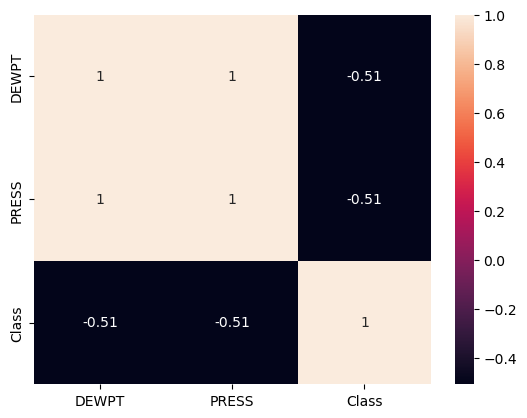

In [20]:
corrMatrix = new2_df.corr()
sns.heatmap(corrMatrix, annot=True)
plt.show()